# Домашнее задание: подготовка и обучение WGAN-GP



# Подготовка данных

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
from torchvision.utils import save_image, make_grid
import matplotlib.pyplot as plt
import numpy as np
import os
import shutil
from tqdm import tqdm
import tempfile
from PIL import Image

In [ ]:
# Установка seed для воспроизводимости и проверка доступности куды
torch.manual_seed(42)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cpu


Мы будем работать с датасетом с аниме лицами с кагла. Датасет можно найти [тут](https://www.kaggle.com/datasets/splcher/animefacedataset).

Ниже мы приведём способо скачивания и подгрузки данных, однако вы можете также напряму скачать датасет с кагла и перенести его в интересующую папку.

In [ ]:
!pip install -q kaggle

In [ ]:
from google.colab import userdata

os.environ["KAGGLE_KEY"] = userdata.get('KAGGLE_KEY')
os.environ["KAGGLE_USERNAME"] = userdata.get('KAGGLE_USERNAME')

In [ ]:
!kaggle datasets download -d splcher/animefacedataset

Dataset URL: https://www.kaggle.com/datasets/splcher/animefacedataset
License(s): DbCL-1.0
 92% 362M/395M [00:01<00:00, 345MB/s]
100% 395M/395M [00:01<00:00, 370MB/s]


In [ ]:
!unzip -q animefacedataset.zip -d ./faces


In [ ]:
faces_dir = './faces/images'

print("Количество файлов:", len(os.listdir(faces_dir)))
print("Примеры файлов:", os.listdir(faces_dir)[:5])

Количество файлов: 63565
Примеры файлов: ['24980_2009.jpg', '16292_2006.jpg', '48879_2014.jpg', '34562_2011.jpg', '1101_2001.jpg']


In [ ]:
img = Image.open(f'{faces_dir}/42261_2013.jpg')
print("Размер изображения:", img.size)

img = Image.open(f'{faces_dir}/36532_2012.jpg')
print("Размер изображения:", img.size)

Размер изображения: (78, 78)
Размер изображения: (89, 89)


In [ ]:
image_size = 64
batch_size = 32
img_channels = 3

transform = transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.ToTensor(),
    # Привод из [0, 1] к диапазону [-1, 1]
    transforms.Normalize([0.5] * img_channels, [0.5] * img_channels),
])

dataset = datasets.ImageFolder(root='./faces', transform=transform)
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=2, pin_memory=True)

/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:668: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  warnings.warn(warn_msg)


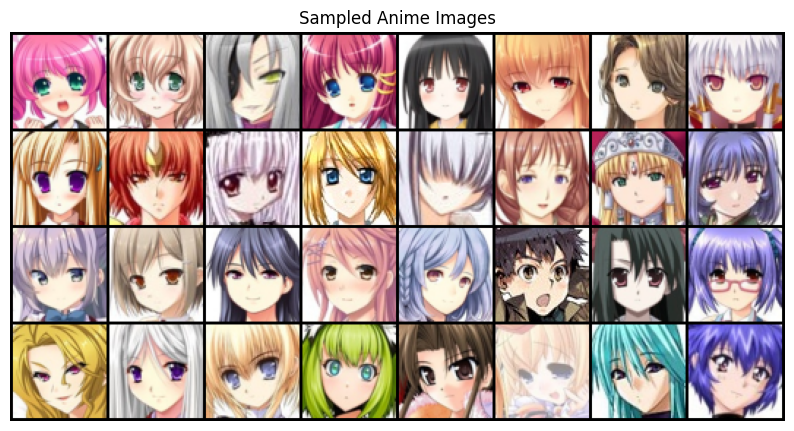

In [ ]:

# Отрисовка сэмплов
# Посмотрим на один батч изображений
data_iter = iter(dataloader)
images, _ = next(data_iter)

# Отключение нормализации для отображения (перевод из [-1, 1] в [0, 1])
images = images * 0.5 + 0.5

# Создание и отображение сетки изображений
grid = make_grid(images, nrow=8)
plt.figure(figsize=(10, 10))
plt.imshow(np.transpose(grid.numpy(), (1, 2, 0)))
plt.axis('off')
plt.title('Sampled Anime Images')
plt.show()

# WGAN-GP (8 баллов)

### Теория

Для начала напомним, что такое WGAN. На лекции вы обсуждали, что у классического гана, который обучался со следующим функционалом:

$$
\min_G \max_D \mathscr{L}(G, D) = \mathbb{E}_{x \sim X} [\log D(x)] + \mathbb{E}_{z \sim Z} [\log (1 - D(G(z)))]
$$

где $G$ — генератор, принимающий на вход латентный вектор $z$ и генерирующий изображение, а $D$ — дискриминатор, который работает как бинарный классификатор, выдавая вероятности для реальных и сгенерированных данных.

В процессе оптимизации мы делаем несколько шагов, обновляя дискриминатор делая шаг по градиенту:

$$\nabla_{\phi} \frac{1}{n} \sum_{i=1}^{n}\left[\log D_{\phi}\left(x_{i}\right)+\log \left(1-D_{\phi}\left(G_{\theta}\left(z_{i}\right)\right)\right)\right]$$

И затем делаем шаг обновления генератора:

$$
\nabla_{\theta} \left[\frac{1}{n} \sum_{i=1}^{n} \log \left(1-D_{\phi^{*}}\left(G_{\theta}\left(z_{i}\right)\right)\right) \right]
$$

Однако у такой модели есть ряд проблем.

В случае, если мы очень хорошо обучили дискриминатор, значения под логарифмом будет близко к 1 при обучении генератора, а значит градиенты будут практически нулевыми и модель обучаться не будет.

Такой лосс также не учитывает, насколько близко находятся распределения реальных и сгенерированных данных.

**Wasserstein GAN (WGAN)** решает эти проблемы, заменяя функцию потерь на расстояние Вассертшейна или Earth Mover's Distance. Этот лосс измеряет минимальную "стоимость" перемещения данных, чтобы преобразовать одно распределение в другое.

$$W_1(p_{\text{data}}, p_{gen}) = \inf_{\gamma \in \Pi(p_{\text{data}}, p_{gen})} \mathbb{E}_{(x, y) \sim \gamma} [| x - y |]$$

Формула выглядит страшно, но в таком виде она нам и не понадобится. На самом деле она сводится к следующему:

$$  W_1(p_{\text{data}}, p_{\mathscr{G}}) = \sup_{\| f \|_L \leq 1} \left( \mathbb{E}_{x \sim p_{\text{data}}} [f(x)] - \mathbb{E}_{y \sim p_{gen}} [f(y)] \right)  $$

Дискриминатор превращается в **критика**, который теперь не является обычным бинарным классификатором и выдаёт не вероятность, а скалярное значение, оценивающее "реалистичность" изображения. Также наш **критик** должен удовлетворять условию Липшевости.



> С математической точки зрения, функция f называется L-липшицевой, если для любых двух точек $x_1$ и $x_2$ в её области определения выполняется следующее неравенство: $∣f(x_1 )−f(x_2 )∣ \leq L⋅∣x_1 − x_2 ∣$.

То есть по сути наша фукция не должна **меняться слишком быстро.**

В оригинальной статье предлагается делать clipping для градиентов $w \in [c, c]$ где $w$ - параметры критика, а $c$ - некоторое маленькое число, чтобы выполнялось данное условие.

Более подробно и математически строго про WGAN можно почитать в [оригинальной статье](https://arxiv.org/pdf/1701.07875).



**Wasserstein GAN with gradient penalty (WGAN -- GP)**

Предложенный в оригинальной статье метод по ограничению весов часто приводит к нестабильности обучения и плохой сходимости.

**Gradient Penalty** добавляет штраф за отклонение нормы градиента от 1, что делает обучение критика более стабильным и позволяет ему моделировать более сложные функции без жестких ограничений на веса.

$$ \mathscr{L} = \mathbb{E}_{\hat{x} \sim p_{\hat{x}}} \left[ (| \nabla_{\hat{x}} \mathscr{D}(\hat{x}) |_2 - 1)^2 \right] $$

Что такое $\hat{x}$:

$$ \hat{x} = \alpha x + (1 - \alpha) y, \quad \alpha \sim U[0, 1]$$

По сути это интерполяция между реальными и сгенерированными данным, где $x \sim p_{data}$ и $y\sim p_{gen}$.

Более подробно о градиентном штрафе можно почитать в [оригинальной статье](https://arxiv.org/pdf/1704.00028).


Давайте теперь построим генератор и критика для обучения.

### Теория без формул

#### Классический GAN

- В классическом GAN есть две нейросети: **генератор** и **дискриминатор**.
- **Генератор** учится создавать изображения, похожие на настоящие, из случайного шума.
- **Дискриминатор** учится отличать настоящие изображения от сгенерированных.
- Они играют в игру: генератор старается обмануть дискриминатор, а дискриминатор — не дать себя обмануть.
- Обе сети обучаются поочередно: сначала улучшаем дискриминатор, потом генератор.
- Проблема: если дискриминатор становится слишком хорошим, генератор почти не получает полезных сигналов для обучения (градиенты почти нулевые), и обучение "замирает".
- Ещё одна проблема: классический подход не учитывает, насколько сильно отличаются распределения настоящих и сгенерированных картинок — только пытается их разделить.


#### WGAN (Wasserstein GAN)

- В WGAN вместо "угадай — настоящее или фейк" используется другая идея: **оценить, насколько далеки друг от друга распределения настоящих и сгенерированных данных**.
- Для этого вводится новая функция потерь, которая измеряет "стоимость" превращения одного распределения в другое (это называется расстоянием Вассерштейна или Earth Mover's Distance).
- Теперь дискриминатор превращается в **критика**. Он не говорит "настоящее/фейк", а просто выдаёт число, которое отражает "реалистичность" картинки.
- Критик должен быть "гладким", то есть его выход не должен резко меняться при небольших изменениях входа (это называется условием Липшица).
- В оригинальной версии WGAN для этого просто ограничивали веса критика, чтобы он не мог слишком резко реагировать на изменения.


#### WGAN-GP (WGAN с градиентным штрафом)

- Ограничение весов оказалось не очень удачным: обучение часто становилось нестабильным.
- Поэтому придумали другой способ: **градиентный штраф**.
- Теперь критик штрафуется, если его выход слишком быстро меняется при изменении входа.
- Для этого берут точки между настоящими и сгенерированными изображениями, считают, насколько быстро меняется выход критика, и добавляют штраф, если эта скорость отличается от нужной.
- Это делает обучение более стабильным и позволяет критику быть более гибким.


#### Итог

- Классический GAN — может "застревать" и не всегда хорошо учится.
- WGAN — оценивает, насколько близки распределения, а не просто "угадывает".
- WGAN-GP — делает обучение ещё стабильнее и позволяет строить более сложные модели.


### Генератор (5 баллов)

Подготовьте код генератора. Рекомендуем сделать блочную структуру, где каждый блок содержит:

```
 nn.ConvTranspose2d
 nn.BatchNorm2d
 nn.ReLU
```
Однако вы можете сами выбрать архитектуру, которая вам покажется лучше :)


In [ ]:
'''
Генератор получает только случайный шум (латентный вектор).
Его задача — научиться "придумывать" изображения, которые будут похожи на настоящие.
Явно не указываем размер картинки, она задается архитектурой.
'''
class Generator(nn.Module):
  '''
  z_dim — размерность латентного вектора
  img_channels — количество каналов в выходном изображении.
  features_g — базовое количество каналов в слоях генератора
  '''
  def __init__(self, z_dim=128, channels_img=img_channels, features_g=64):
    super(Generator, self).__init__()

    '''
    Задача генератора — создать изображение из случайного вектора, а не обработать уже существующее.
    Чтобы "фантазировать" изображения с нуля не должна быть задана пространственная структура, поэтому
    начать нужно с картинки 1×1.

    nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride, padding, bias)
    Это деконволюционная свёртка, которая "разворачивает" тензор, увеличивая его пространственный размер.
    in_channels и out_channels — определяют, сколько фильтров информации
    передаётся между слоями(это не размер картинки).
    kernel_size, stride, padding — определяют, как меняется ширина и высота картинки на каждом слое.
    output_image_size = (input_image_size - 1) * stride - 2 * padding + kernel_size

    из латентного вектора z_dim×1×1, получаем заготовку картинки с большим количеством каналов z_dim*8×4×4.
    Дальше постепенно увеличиваем размер изображения
    (в 2 раза пока не дойдем до img_channels×image_size×image_size), уменьшая число каналов.

    Первый слой: 4×4
    Второй слой: 8×8
    Третий слой: 16×16
    Четвёртый слой: 32×32
    Пятый слой: 64×64

    Для того чтобы увеличивать картинку в два раза:
    kernel_size=4, stride=2, padding=1 потому что:
    output_image_size = (input_image_size - 1) * 2 - 2 * 1 + 4 = 2 * input_image_size

    А для первого шага 1x1 ---> 4x4:
    kernel_size=4, stride=1, padding=0 потому что:
    output_image_size = (input_image_size - 1) * 1 - 2 * 0 + 4 = input_image_size + 3

    Такой подход позволяет сети "сначала придумать общую структуру", а потом добавлять детали на каждом следующем уровне разрешения.
    '''

    kernel_size_to_add_3 = 4
    strides_to_add_3 = 1
    padding_to_add_3 = 0

    kernel_size_to_x2 = 4
    strides_to_x2 = 2
    padding_to_x2 = 1

    out_channels = []

    self.net = nn.Sequential(
      nn.ConvTranspose2d(z_dim, features_g * 8, kernel_size_to_add_3, strides_to_add_3, padding_to_add_3, bias=False),
      nn.BatchNorm2d(features_g * 8),
      nn.ReLU(True),

      nn.ConvTranspose2d(features_g * 8, features_g * 4, kernel_size_to_x2, strides_to_x2, padding_to_x2, bias=False),
      nn.BatchNorm2d(features_g * 4),
      nn.ReLU(True),

      nn.ConvTranspose2d(features_g * 4, features_g * 2, kernel_size_to_x2, strides_to_x2, padding_to_x2, bias=False),
      nn.BatchNorm2d(features_g * 2),
      nn.ReLU(True),

      nn.ConvTranspose2d(features_g * 2, features_g, kernel_size_to_x2, strides_to_x2, padding_to_x2, bias=False),
      nn.BatchNorm2d(features_g),
      nn.ReLU(True),

      nn.ConvTranspose2d(features_g, img_channels, kernel_size_to_x2, strides_to_x2, padding_to_x2, bias=False),
      # переводим значения в диапозон [-1, 1]
      nn.Tanh(),
    )


  def forward(self, x):
    return self.net(x)

### Критик (7 баллов)

Теперь давайте построим критика.

Для остроения критика используйте

```
nn.Conv2d
nn.InstanceNorm2d
nn.LeakyReLU
```



In [ ]:
'''
Критик получает картинку(настоящую либо сгенерированную).
Его задача — выдавать большие значения для реальных изображений и маленькие для сгенерированных.
Явно не указываем размер картинки, она ожидается архитектурой.
'''
class Critic(nn.Module):
  def __init__(self, channels_img=img_channels, features_d=128):
    super(Critic, self).__init__()

    '''
    nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding)
    Это сверточный слой. Параметры аналогичные ConvTranspose2d
    Только здесь мы "сжимаем" тензор,
    '''
    kernel_size_to_divide_2 = 4
    strides_to_divide_2 = 2
    padding_to_divide_2 = 1

    kernel_size_to_subtract_3 = 4
    strides_to_subtract_3 = 1
    padding_to_subtract_3 = 0

    self.net = nn.Sequential(
      nn.Conv2d(img_channels, features_d, kernel_size_to_divide_2, strides_to_divide_2, padding_to_divide_2),
      nn.LeakyReLU(0.2, inplace=True),

      nn.Conv2d(features_d, features_d * 2, kernel_size_to_divide_2, strides_to_divide_2, padding_to_divide_2),
      nn.InstanceNorm2d(features_d * 2, affine=True),
      nn.LeakyReLU(0.2, inplace=True),

      nn.Conv2d(features_d * 2, features_d * 4, kernel_size_to_divide_2, strides_to_divide_2, padding_to_divide_2),
      nn.InstanceNorm2d(features_d * 4, affine=True),
      nn.LeakyReLU(0.2, inplace=True),

      nn.Conv2d(features_d * 4, features_d * 8, kernel_size_to_divide_2, strides_to_divide_2, padding_to_divide_2),
      nn.InstanceNorm2d(features_d * 8, affine=True),
      nn.LeakyReLU(0.2, inplace=True),

      nn.Conv2d(features_d * 8, 1, kernel_size_to_subtract_3, strides_to_subtract_3, padding_to_subtract_3),
    )

  def forward(self, x):
    return self.net(x)

### Лосс для обучения (3 балла)

Давайте теперь подготовим лосс для обучения.

Напомним:

1. $ \hat{x} = \alpha x + (1 - \alpha) y, \quad \alpha \sim U[0, 1]$
  где $x \sim p_{data}$ и $y\sim p_{gen}$.

2. $ \mathscr{L} = \mathbb{E}_{\hat{x} \sim p_{\hat{x}}} \left[ (| \nabla_{\hat{x}} \mathscr{D}(\hat{x}) |_2 - 1)^2 \right] $




In [ ]:
def compute_gradient_penalty(critic, real, fake, device, lambda_gp):
    """
    Computes the gradient penalty for WGAN-GP to enforce 1-Lipschitz continuity.

    Args:
        critic (nn.Module): Critic model that takes images and outputs a scalar.
        real (torch.Tensor): Real images from the dataset [batch_size, channels, height, width].
        fake (torch.Tensor): Generated images [batch_size, channels, height, width].
        device (torch.device): Device (CPU or GPU).

    Returns:
        torch.Tensor: Scalar gradient penalty.
    """
    batch_size, channels, height, width = real.shape

    # Создаём интерполированные данные с помощью torch.rand для сэмлплирования alpha
    alpha = torch.rand(batch_size, 1, 1, 1, device=device)
    x_hat = alpha * real + (1 - alpha) * fake
    x_hat = x_hat.requires_grad_(True)

    # Предсказания критика
    disc_interpolates = critic(x_hat)

    # Подготовка градиентов
    grad_outputs = torch.ones_like(disc_interpolates, device=device)

    # Подсчёт градиентов
    gradients = torch.autograd.grad(
        outputs=disc_interpolates,
        inputs=x_hat,
        grad_outputs=grad_outputs,
        create_graph=True,
        retain_graph=True
    )[0]
    gradients = gradients.view(batch_size, -1)

    # Вычисление норм градиентов
    gradient_norm = gradients.norm(2, dim=1)

    # Вычисление лосса
    penalty = ((gradient_norm - 1) ** 2).mean()

    return penalty * lambda_gp

Подготовим несколько вспомогательных функций

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
drive_root = '/content/drive/MyDrive/papadyk-collab/wgan2'
output_dir = os.path.join(drive_root, 'output')

Mounted at /content/drive


In [ ]:
def setup_output_directories(output_dir):
    """Создает необходимые директории для сохранения результатов обучения."""
    images_dir = os.path.join(output_dir, 'images')
    weights_dir = os.path.join(output_dir, 'weights')
    os.makedirs(images_dir, exist_ok=True)
    os.makedirs(weights_dir, exist_ok=True)
    return images_dir, weights_dir

In [ ]:
def save_and_plot_samples(generator, fixed_noise, epoch, images_dir):
    """Генерирует изображения, сохраняет их и отрисовывает."""
    with torch.no_grad():
        generator.eval()
        fake = generator(fixed_noise).detach().cpu()
        generator.train()

        # Денормализация: [-1, 1] -> [0, 1]
        fake = fake * 0.5 + 0.5

        # Сохранение сетки изображений
        image_path = os.path.join(images_dir, f'fake_samples_epoch_{epoch:03d}.png')
        save_image(fake, image_path, nrow=8)

        # Отображение
        grid = make_grid(fake, nrow=8)
        plt.figure(figsize=(10, 10))
        plt.imshow(np.transpose(grid.numpy(), (1, 2, 0)))
        plt.title(f"Сгенерированные изображения: Эпоха {epoch}")
        plt.axis('off')
        plt.show()

In [ ]:
def save_model_weights(netG, netC, epoch, weights_dir):
    """Сохраняет веса Генератора и Критика."""
    torch.save(netG.state_dict(), os.path.join(weights_dir, f'netG_epoch_{epoch:03d}.pth'))
    torch.save(netC.state_dict(), os.path.join(weights_dir, f'netD_epoch_{epoch:03d}.pth'))

In [ ]:
def save_checkpoint(gen, crit, opt_gen, opt_crit, epoch, losses, weights_dir):
    checkpoint = {
        'epoch': epoch,
        'gen_state_dict': gen.state_dict(),
        'crit_state_dict': crit.state_dict(),
        'opt_gen_state_dict': opt_gen.state_dict(),
        'opt_crit_state_dict': opt_crit.state_dict(),
        'gen_losses': losses[0],
        'crit_losses': losses[1],
    }
    torch.save(checkpoint, os.path.join(weights_dir, f'checkpoint_epoch_{epoch:03d}.pth'))

In [ ]:
def plot_training_losses(gen_losses, crit_losses, images_dir):
    """Отрисовывает графики лоссов после завершения обучения."""
    plt.figure(figsize=(10, 5))
    plt.plot(gen_losses, label='Generator Loss', color='blue')
    plt.plot(crit_losses, label='Critic Loss', color='red')
    plt.xlabel("Эпохи")
    plt.ylabel("Лосс (Wasserstein Distance + GP)")
    plt.title("Лосс Генератора и Критика во время обучения")
    plt.legend()
    plt.grid(True)
    plt.show()

    plt.savefig(os.path.join(images_dir, "loss_plot.png"))

Подготовим функцию обучения (5 баллов)

Помимо ограничения на градиенты, не забываем использовать лосс WGAN.


$$ L = - \mathbb{E}_{x \sim p_{\text{data}}} [\mathscr{D}(x)] + \mathbb{E}_{z \sim p_z(z)} [\mathscr{D}(\mathscr{G}(z))] + \lambda \mathbb{E}_{\hat{x} \sim p_{\hat{x}}} \left[ (| \nabla_{\hat{x}} \mathscr{D}(\hat{x}) |_2 - 1)^2 \right] $$


In [ ]:
def train_wgan_gp(start_epoch, dataloader, gen, crit, opt_gen, opt_crit, num_epochs, z_dim, device, lambda_gp=10, critics_per_gen=5, output_dir="output"):
    """
    Обучает модель WGAN-GP, выводит лоссы, сохраняет картинки и веса каждую эпоху,
    и отрисовывает финальный график лоссов.
    """

    # 1. Инициализация
    gen_losses = []
    crit_losses = []
    fixed_noise = torch.randn(64, z_dim, 1, 1, device=device)
    images_dir, weights_dir = setup_output_directories(output_dir)

    print(f"Начало обучения WGAN-GP на {num_epochs} эпох...")

    # 2. Основной цикл обучения
    for epoch in range(start_epoch, num_epochs + 1):
        epoch_g_loss = 0.0
        epoch_c_loss = 0.0
        num_batches = len(dataloader)
        batch_iterator = tqdm(dataloader, desc=f"Эпоха {epoch}/{num_epochs}", leave=False)

        for i, (real_images, _) in enumerate(batch_iterator):
            real_images = real_images.to(device)
            batch_size = real_images.size(0)

            # Обучение Критика
            for _ in range(critics_per_gen):
                opt_crit.zero_grad()

                noise = torch.randn(batch_size, z_dim, 1, 1, device=device)
                fake_images = gen(noise).detach()

                crit_real = crit(real_images).view(-1)
                crit_fake = crit(fake_images).view(-1)

                # Gradient Penalty
                gp = compute_gradient_penalty(crit, real_images, fake_images, device, lambda_gp)

                # W-Loss + GP
                crit_loss = -(crit_real.mean() - crit_fake.mean()) + gp

                crit_loss.backward()
                opt_crit.step()

                epoch_c_loss += crit_loss.item() / critics_per_gen

            # Обучение Генератора
            opt_gen.zero_grad()

            noise = torch.randn(batch_size, z_dim, 1, 1, device=device)
            fake_images = gen(noise)

            # G-Loss: -E[D(G(z))]
            gen_loss = -crit(fake_images).view(-1).mean()

            gen_loss.backward()
            opt_gen.step()

            epoch_g_loss += gen_loss.item() # Накапливаем лосс

            batch_iterator.set_postfix(CritLoss=f'{crit_loss.item():.4f}', GenLoss=f'{gen_loss.item():.4f}')

        # 3. Действия в конце эпохи
        avg_g_loss = epoch_g_loss / num_batches
        avg_c_loss = epoch_c_loss / num_batches
        gen_losses.append(avg_g_loss)
        crit_losses.append(avg_c_loss)

        print(f"\n--- Эпоха {epoch}/{num_epochs} ---\nСредний Лосс Критика: {avg_c_loss:.4f}, Средний Лосс Генератора: {avg_g_loss:.4f}")

        # Сохранение и отрисовка
        save_and_plot_samples(gen, fixed_noise, epoch, images_dir)
        save_model_weights(gen, crit, epoch, weights_dir)
        save_checkpoint(gen, crit, opt_gen, opt_crit, epoch, (gen_losses, crit_losses), weights_dir)
        print(f"Изображения и веса сохранены для эпохи {epoch} в {output_dir}.")

    # 4. Финальная валидация
    print("\nОбучение завершено. Отрисовка графиков потерь...")
    plot_training_losses(gen_losses, crit_losses, images_dir)

    return gen, crit, gen_losses, crit_losses

In [ ]:
z_dim = 128
features_g = 64
features_d = 64
num_epochs = 33
lr = 2e-4
b1 = 0.0
b2 = 0.9
lambda_gp = 10
critics_per_gen = 3
start_epoch = 1

generator = Generator(z_dim=z_dim, features_g=features_g).to(device)
critic = Critic(features_d=features_d).to(device)
opt_gen = optim.Adam(generator.parameters(), lr=lr, betas=(b1, b2))
opt_crit = optim.Adam(critic.parameters(), lr=lr, betas=(b1, b2))

Начало обучения WGAN-GP на 33 эпох...



--- Эпоха 22/33 ---
Средний Лосс Критика: -5.0829, Средний Лосс Генератора: -19.2699


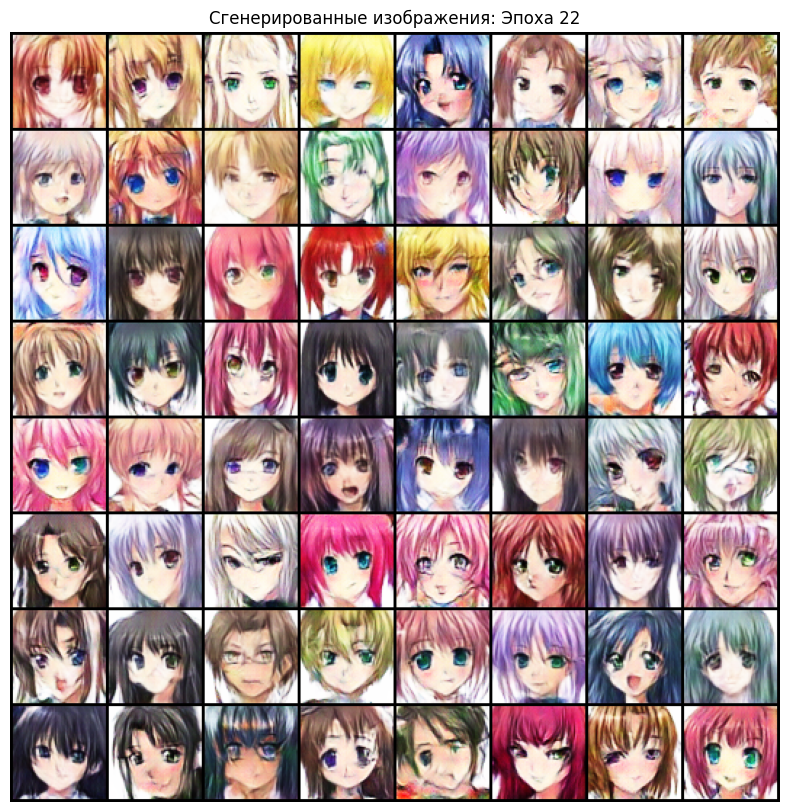

Изображения и веса сохранены для эпохи 22 в /content/drive/MyDrive/papadyk-collab/wgan2/output.



--- Эпоха 23/33 ---
Средний Лосс Критика: -5.0821, Средний Лосс Генератора: -19.2882


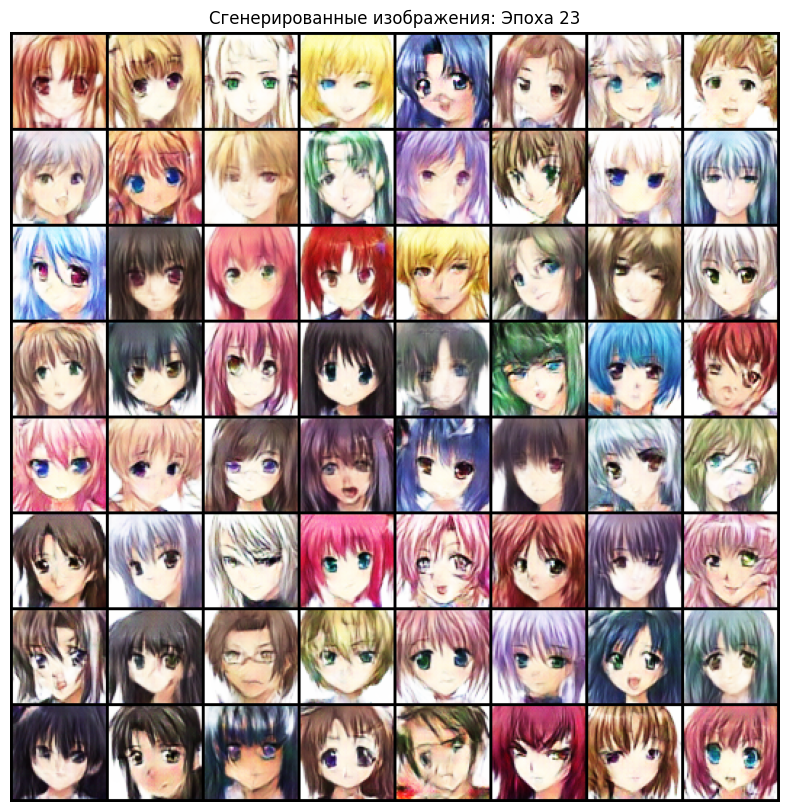

Изображения и веса сохранены для эпохи 23 в /content/drive/MyDrive/papadyk-collab/wgan2/output.



--- Эпоха 24/33 ---
Средний Лосс Критика: -5.0761, Средний Лосс Генератора: -17.6946


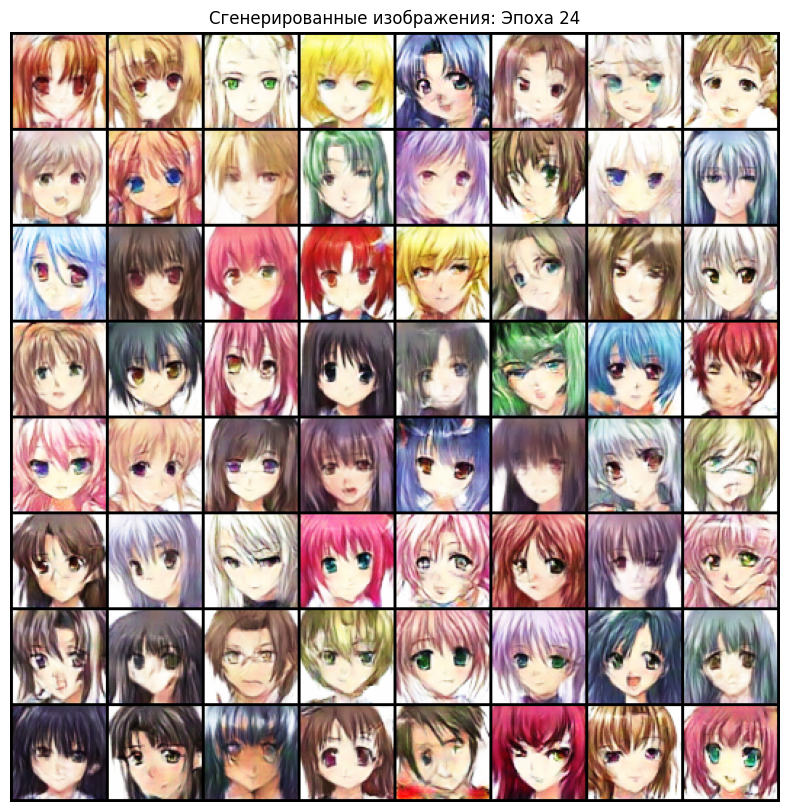

Изображения и веса сохранены для эпохи 24 в /content/drive/MyDrive/papadyk-collab/wgan2/output.



--- Эпоха 25/33 ---
Средний Лосс Критика: -5.1220, Средний Лосс Генератора: -17.4372


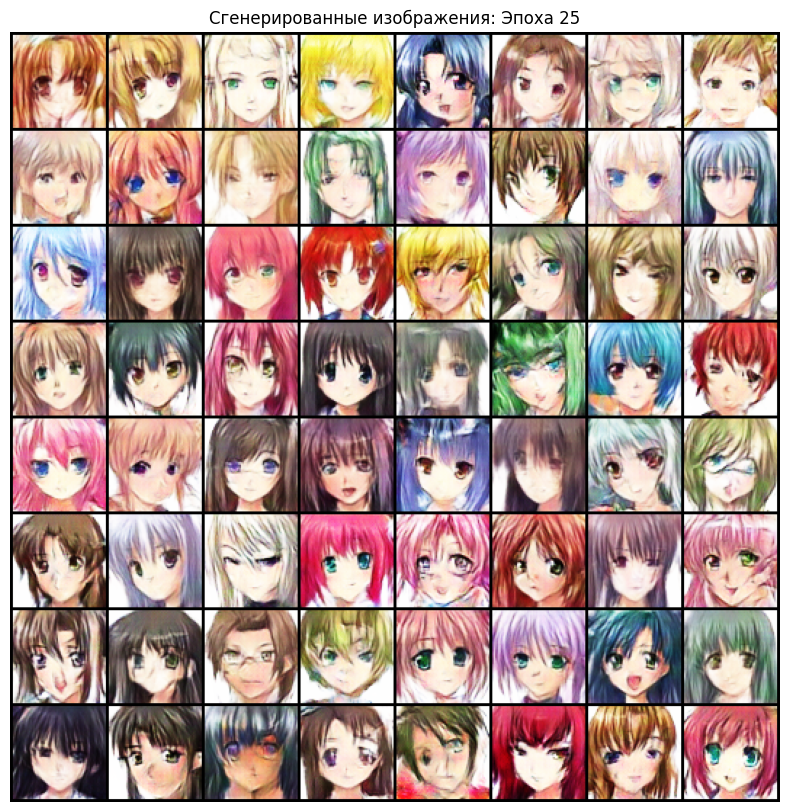

Изображения и веса сохранены для эпохи 25 в /content/drive/MyDrive/papadyk-collab/wgan2/output.



--- Эпоха 26/33 ---
Средний Лосс Критика: -5.1151, Средний Лосс Генератора: -17.6708


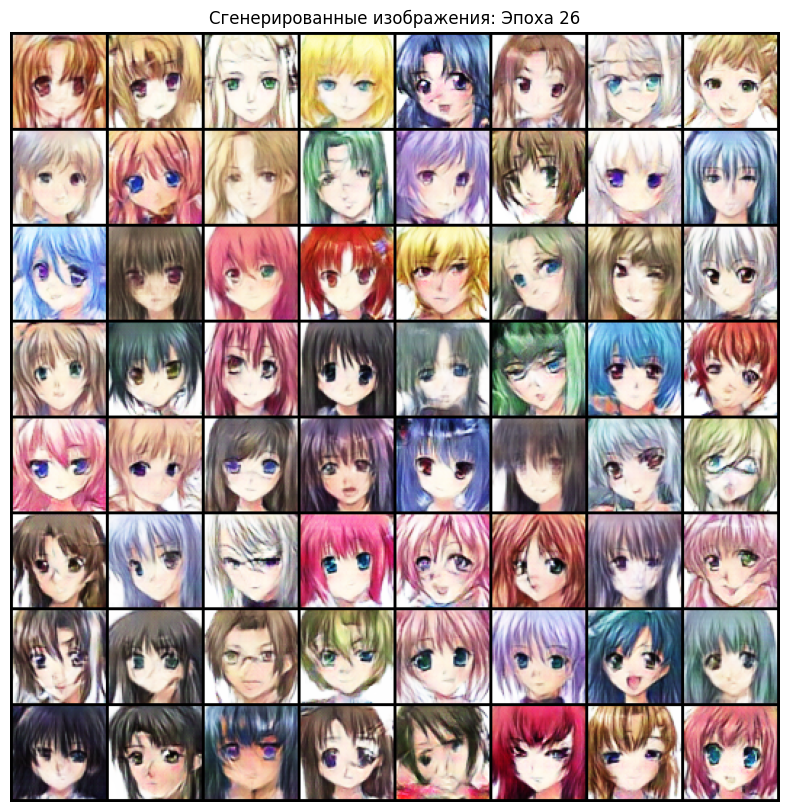

Изображения и веса сохранены для эпохи 26 в /content/drive/MyDrive/papadyk-collab/wgan2/output.



--- Эпоха 27/33 ---
Средний Лосс Критика: -5.1387, Средний Лосс Генератора: -17.8271


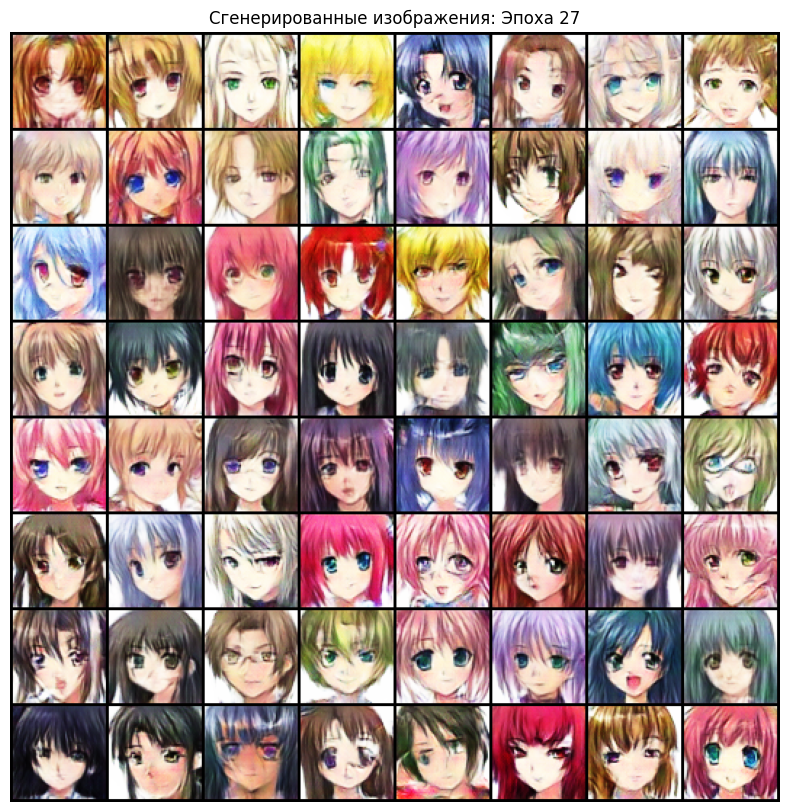

Изображения и веса сохранены для эпохи 27 в /content/drive/MyDrive/papadyk-collab/wgan2/output.



--- Эпоха 28/33 ---
Средний Лосс Критика: -5.1673, Средний Лосс Генератора: -17.7772


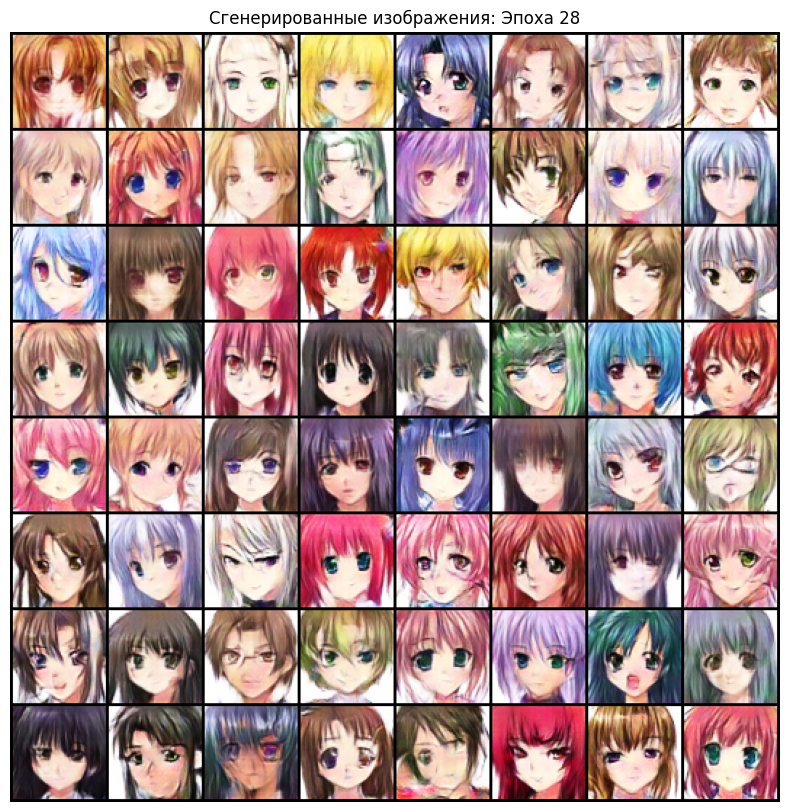

Изображения и веса сохранены для эпохи 28 в /content/drive/MyDrive/papadyk-collab/wgan2/output.



--- Эпоха 29/33 ---
Средний Лосс Критика: -5.1819, Средний Лосс Генератора: -16.4370


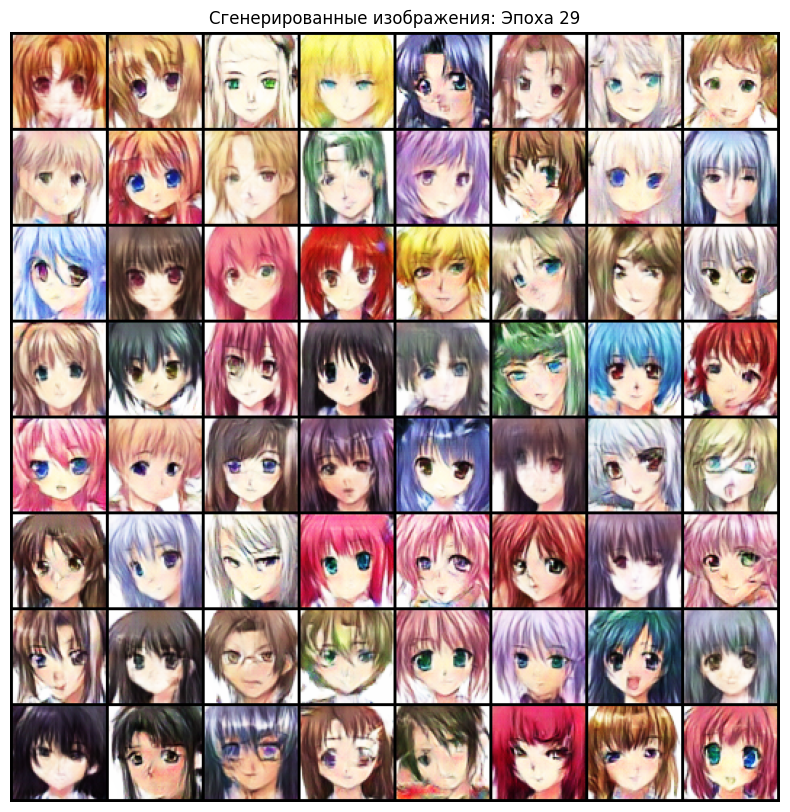

Изображения и веса сохранены для эпохи 29 в /content/drive/MyDrive/papadyk-collab/wgan2/output.



--- Эпоха 30/33 ---
Средний Лосс Критика: -5.2373, Средний Лосс Генератора: -15.9579


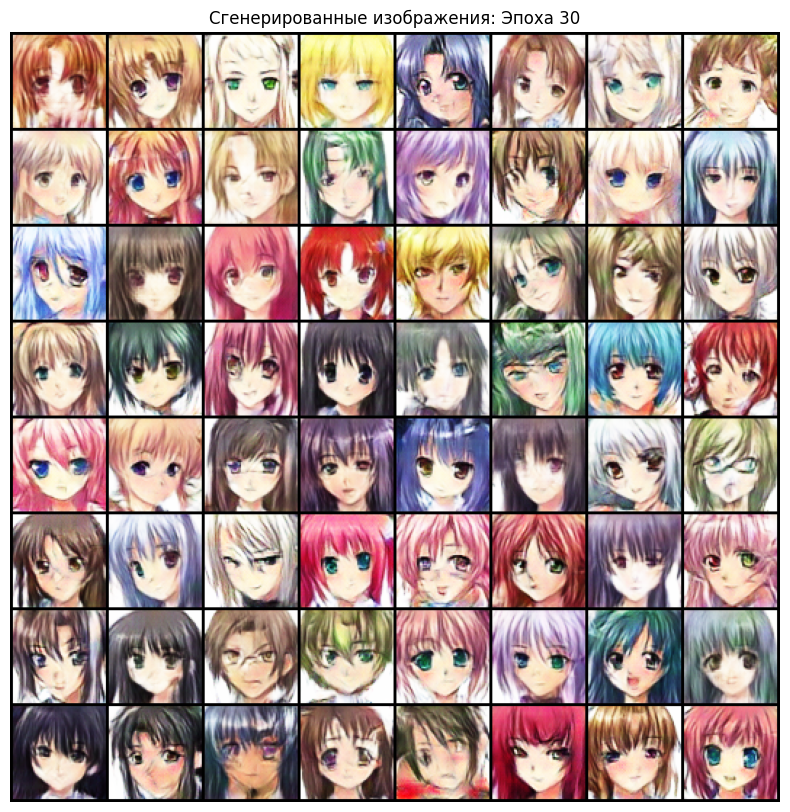

Изображения и веса сохранены для эпохи 30 в /content/drive/MyDrive/papadyk-collab/wgan2/output.



--- Эпоха 31/33 ---
Средний Лосс Критика: -5.2258, Средний Лосс Генератора: -15.0794


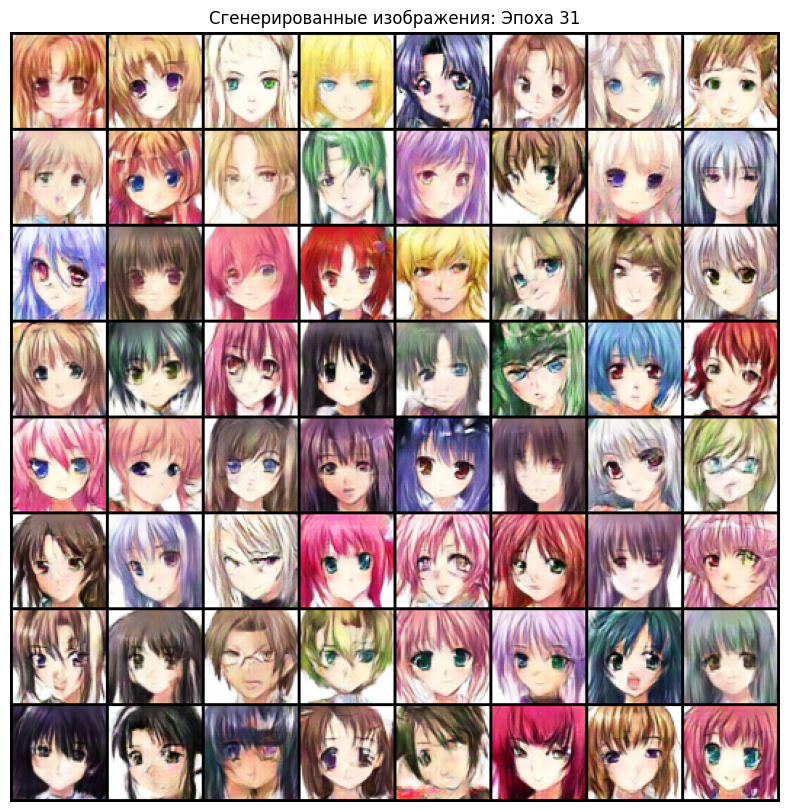

Изображения и веса сохранены для эпохи 31 в /content/drive/MyDrive/papadyk-collab/wgan2/output.


Эпоха 32/33:  79%|███████▉  | 1567/1987 [05:02<01:20,  5.24it/s, CritLoss=-8.7232, GenLoss=-15.5495]

In [ ]:
gen, crit, gen_losses, crit_losses = train_wgan_gp(start_epoch, dataloader, generator, critic, opt_gen, opt_crit, num_epochs, z_dim, device, lambda_gp, critics_per_gen, output_dir)

## Валидация обученной модели

Для валидации будем использовать библиотеку `clean-fid`

In [ ]:
checkpoint = torch.load(f'{output_dir}/weights/checkpoint_epoch_031.pth', map_location=device)

generator.load_state_dict(checkpoint['gen_state_dict'])
critic.load_state_dict(checkpoint['crit_state_dict'])

opt_gen.load_state_dict(checkpoint['opt_gen_state_dict'])
opt_crit.load_state_dict(checkpoint['opt_crit_state_dict'])

gen_losses = checkpoint.get('gen_losses', [])
crit_losses = checkpoint.get('crit_losses', [])
start_epoch = checkpoint['epoch'] + 1

print(start_epoch)

32


In [ ]:
!pip install clean-fid

In [ ]:
generator.eval()

Generator(
  (net): Sequential(
    (0): ConvTranspose2d(128, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)

In [ ]:
from cleanfid import fid

def get_images_to_fid_format(images_list):
    """
    Преобразование картинок для clean-fid формата
    """
    all_images = torch.cat(images_list, dim=0)
    all_images = all_images * 0.5 + 0.5
    all_images = all_images.mul(255).add(0.5).clamp(0, 255).permute(0, 2, 3, 1).to('cpu', torch.uint8).numpy()
    return all_images

def save_images_to_folder(image_array, folder_path, max_to_save=None):
    """
    Сохранение изображений
    """
    os.makedirs(folder_path, exist_ok=True)

    num_images = image_array.shape[0]
    if max_to_save is not None and max_to_save < num_images:
        images_to_process = image_array[:max_to_save]
        print(f"Сохраняем первые {max_to_save} изображений в {folder_path}...")
    else:
        images_to_process = image_array
        print(f"Сохраняем все {num_images} изображений в {folder_path}...")

    for i in tqdm(range(images_to_process.shape[0]), desc=f"Сохранение в {os.path.basename(folder_path)}"):
        img = Image.fromarray(images_to_process[i])
        img.save(os.path.join(folder_path, f"{i:05d}.png"))


def calculate_final_fid_fixed(
    trained_gen,
    dataloader,
    z_dim,
    device,
    num_samples=10000,
    save_generated_path=None,
    save_real_path=None,
    max_saved_images=100
):
    """
    Собирает реальные и фейковые изображения, преобразует их,
    сохраняет во временные папки для FID и опционально сохраняет
    изображения в постоянные папки.
    """

    # 1. Сбор реальных изображений
    print("Собираем реальные изображения...")
    real_images_list = []
    for images, _ in dataloader:
        real_images_list.append(images.cpu())
        if len(real_images_list) * dataloader.batch_size >= num_samples:
             break
    real_images_array = get_images_to_fid_format(real_images_list)[:num_samples]

    if save_real_path:
        print(f"\nОбнаружен save_real_path. Сохраняем реальные изображения в: {save_real_path}")
        # Сохраняем только часть, определенную max_saved_images
        save_images_to_folder(real_images_array, save_real_path, max_to_save=max_saved_images)
        print("Сохранение реальных изображений завершено.")

    # 2. Генерация фейковых изображений
    print(f"\nГенерируем {num_samples} фейковых изображений...")
    trained_gen.eval()
    fake_images_list = []
    batch_size = dataloader.batch_size

    for i in tqdm(range(0, num_samples, batch_size)):
        current_batch_size = min(batch_size, num_samples - i)
        noise = torch.randn(current_batch_size, z_dim, 1, 1, device=device)
        with torch.no_grad():
            fake_batch = trained_gen(noise).cpu()
        fake_images_list.append(fake_batch)

    fake_images_array = get_images_to_fid_format(fake_images_list)

    if save_generated_path:
        print(f"\nОбнаружен save_generated_path. Сохраняем сгенерированные изображения в: {save_generated_path}")
        # Сохраняем только часть, определенную max_saved_images
        save_images_to_folder(fake_images_array, save_generated_path, max_to_save=max_saved_images)
        print("Сохранение сгенерированных изображений завершено.")

    # 3. Расчет FID: ИСПОЛЬЗУЕМ ВРЕМЕННЫЕ ПАПКИ
    print("\nНачинаем расчет FID...")

    with tempfile.TemporaryDirectory() as real_dir, tempfile.TemporaryDirectory() as fake_dir:

        # Для FID сохраняем все необходимые num_samples изображений
        print("Сохраняем реальные изображения во временную папку для FID...")
        save_images_to_folder(real_images_array, real_dir, max_to_save=None)

        print("Сохраняем фейковые изображения во временную папку для FID...")
        save_images_to_folder(fake_images_array, fake_dir, max_to_save=None)

        fid_value = fid.compute_fid(
            real_dir,
            fake_dir,
            model_name="inception_v3",
            device=device,
            verbose=True
        )
        return fid_value




In [ ]:
final_fid_score = calculate_final_fid_fixed(
    trained_gen=generator,
    dataloader=dataloader,
    z_dim=z_dim,
    device=device,
    num_samples=10000,
    save_generated_path="generated_samples",
    save_real_path="real_samples",
    max_saved_images=100
)
final_fid_score

Собираем реальные изображения...


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:668: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  warnings.warn(warn_msg)



Обнаружен save_real_path. Сохраняем реальные изображения в: real_samples
Сохраняем первые 100 изображений в real_samples...


Сохранение в real_samples: 100%|██████████| 100/100 [00:00<00:00, 824.75it/s]


Сохранение реальных изображений завершено.

Генерируем 10000 фейковых изображений...


100%|██████████| 313/313 [01:03<00:00,  4.94it/s]



Обнаружен save_generated_path. Сохраняем сгенерированные изображения в: generated_samples
Сохраняем первые 100 изображений в generated_samples...


Сохранение в generated_samples: 100%|██████████| 100/100 [00:00<00:00, 901.85it/s]


Сохранение сгенерированных изображений завершено.

Начинаем расчет FID...
Сохраняем реальные изображения во временную папку для FID...
Сохраняем все 10000 изображений в /tmp/tmpv544yj8g...


Сохранение в tmpv544yj8g: 100%|██████████| 10000/10000 [00:13<00:00, 757.24it/s]


Сохраняем фейковые изображения во временную папку для FID...
Сохраняем все 10000 изображений в /tmp/tmpp3p8znbu...


Сохранение в tmpp3p8znbu: 100%|██████████| 10000/10000 [00:11<00:00, 843.85it/s]


compute FID between two folders


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 12 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Found 10000 images in the folder /tmp/tmpv544yj8g


FID tmpv544yj8g : 100%|██████████| 313/313 [1:00:47<00:00, 11.65s/it]


Found 10000 images in the folder /tmp/tmpp3p8znbu


FID tmpp3p8znbu : 100%|██████████| 313/313 [57:16<00:00, 10.98s/it]


np.float64(92.53879566132139)